In [2]:
pylab inline

Populating the interactive namespace from numpy and matplotlib


In [1]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import numpy as np
import healpy as hp
import schnell as snl
import matplotlib.pyplot as plt
from scipy.integrate import quad
from matplotlib import rc
import itertools as it
rc('font', **{'family': 'sans-serif',
              'sans-serif': ['Helvetica']})
rc('text', usetex=False)

lisa_old = [snl.LISADetector(i, is_L5Gm=True) for i in range(3)]
lisa = [snl.LISADetector(i, is_L5Gm=False) for i in range(3)]
alia = [snl.ALIADetector(i) for i in range(3)]
lisalia = [snl.LISAandALIADetector(i) for i in range(6)]
twolisas = [snl.TwoLISADetector(i) for i in range(6)]
star = [snl.BBOStarDetector(i) for i in range(6)]

from datetime import datetime
now = datetime.now()
current_time = now.strftime("%H:%M:%S")
print("Run of {}".format(current_time))

Run of 14:12:55


In [4]:
t_obs = 4 # years
obs_time = t_obs * 365 * 24 * 3600
freqs = np.geomspace(1E-4, 0.2, 1001)
f_ref = 1E-2
nside = 64

freqs_lr = np.geomspace(1E-4, 0.2, 101)
nside_lr = 32

npix = hp.nside2npix(nside)
theta, phi = hp.pix2ang(nside, np.arange(npix))
f_obs = 1e-2

rhoLO = snl.NoiseCorrelationLISA(lisa_old[0])
rhoL = snl.NoiseCorrelationLISA(lisa[0])
rhoA = snl.NoiseCorrelationLISAlike(alia[0])
rhoLA = snl.NoiseCorrelationLISALIA(lisalia[0])
rhoTL = snl.NoiseCorrelationTwoLISA(twolisas[0])


mcLO = snl.MapCalculator(lisa_old, f_pivot=f_ref,
                       corr_matrix=rhoLO)
mcL = snl.MapCalculator(lisa, f_pivot=f_ref,
                       corr_matrix=rhoL)
mcA = snl.MapCalculator(alia, f_pivot=f_ref,
                       corr_matrix=rhoA)
mcLA = snl.MapCalculator(lisalia, f_pivot=f_ref,
                       corr_matrix=rhoLA)
mcTL = snl.MapCalculator(twolisas, f_pivot=f_ref,
                       corr_matrix=rhoTL)

stc1 = np.array((1, 0, 0, 1))
enc1 = np.array((0, 1, 1, 1))
stc2 = np.array([0, 1, 0, 1])
enc2 = np.array([0, 0, 0, 1])
def choose_color(i, n, st_c=stc1, en_c=enc1):
    return st_c + (en_c-st_c) * i / n

Computing monopole for LISA

In [5]:
obs_t_1y = 365 * 24 * 3600
monopoleL = mcL.get_monopole_curve(obs_t_1y, freqs_lr, nside, compute_FED=True)

In [ ]:
plt.plot(freqs, monopoleL)
plt.yscale('log')

## Chart + minimization of noise on baseline at 0.1 AU

In [6]:
distances = [0.05, 0.07, 0.1, 0.3, 0.5, 1]
twolisas_dist_zero = np.array([[snl.TwoLISADetector(i, separation=dist) for i in range(6)] for dist in distances])
rhoTL_dist_zero = [snl.NoiseCorrelationTwoLISA(twolisas_dist_zero[d, 0]) for d in range(len(distances))]
mcTL_dist_zero = [snl.MapCalculator(twolisas_dist_zero[d], f_pivot=f_ref, corr_matrix=rhoTL_dist_zero[d]) for d in range(len(distances))]

twolisas_dist_pi = np.array([[snl.TwoLISADetector(i, separation=dist) for i in range(6)] for dist in distances])
for d in range(len(distances)):
    for i in range(6):
        twolisas_dist_pi[d][i].lam = np.pi
rhoTL_dist_pi = [snl.NoiseCorrelationTwoLISA(twolisas_dist_pi[d, 0]) for d in range(len(distances))]
mcTL_dist_pi = [snl.MapCalculator(twolisas_dist_pi[d], f_pivot=f_ref, corr_matrix=rhoTL_dist_pi[d]) for d in range(len(distances))]

In [7]:
nl_dist_zero = []
nl_dist_pi = []
for d in range(len(distances)):
    nl_dist_zero.append(mcTL_dist_zero[d].get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True))
    print(f"0 : {distances[d]} AU : done")
    nl_dist_pi.append(mcTL_dist_pi[d].get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True))
    print(f"$\pi$ : {distances[d]} AU : done")

KeyboardInterrupt: 

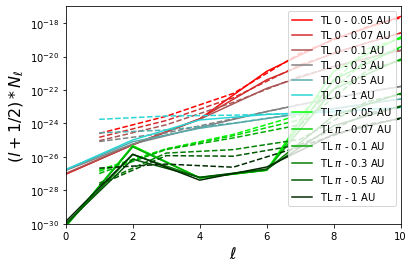

In [17]:
ls = np.arange(3 * nside_lr)

n = len(distances)
plt.figure()
for d in range(len(distances)):
    plt.plot(ls[::2], ((ls+.5) *nl_dist_zero[d])[::2], color=choose_color(d, n), label=f"TL 0 - {distances[d]} AU")
    plt.plot(ls[1::2], ((ls+.5) *nl_dist_zero[d])[1::2], '--', color=choose_color(d, n))
for d in range(len(distances)):
    plt.plot(ls[::2], ((ls+.5) *nl_dist_pi[d])[::2], color=choose_color(d, n, stc2, enc2), label=f"TL $\pi$ - {distances[d]} AU")
    plt.plot(ls[1::2], ((ls+.5) *nl_dist_pi[d])[1::2], '--', color=choose_color(d, n, stc2, enc2))
plt.yscale("log")
plt.xlabel(r'$\ell$', fontsize=16)
plt.ylabel(r'$(l+1/2) * N_\ell$', fontsize=16)
plt.xlim(0, 10)
plt.ylim(1e-30, 1e-17)
plt.legend()
plt.show();

## Checking chart-baseline results

In [8]:
with open('npy_saves/nl_dist_zero.npy', 'rb') as file_distzero:
    nl_dist_zero = np.load(file_distzero, allow_pickle=True)
with open('npy_saves/nl_dist_pi.npy', 'rb') as file_distpi:
    nl_dist_pi = np.load(file_distpi, allow_pickle=True)

distances = np.arange(1, 20) / 10

Text(0.5, 1.0, 'Curves of $N_\\ell$ relative to the $0$ AU case for $\\ell \\in [0, 20]$')

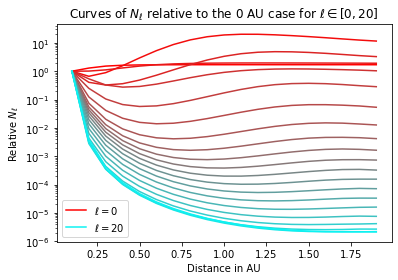

In [20]:
ells = np.arange(21) #[1, 2, 5, 6, 10, 11, 20, 21]
def labif_xyz(l):
    if l in [ells[0], ells[-1]]:
        return f'$\ell={l}$'
    return ''
for i, l in enumerate(ells):
    #plt.figure()
    #plt.plot(distances, nl_dist_pi[:, l] / nl_dist_pi[0, l], '--', color=choose_color(i, len(ells)), label=labif_xyz(l))
    plt.plot(distances, nl_dist_zero[:, l] / nl_dist_zero[0, l], color=choose_color(i, len(ells)), label=labif_xyz(l))
plt.yscale('log')
plt.legend()
plt.xlabel('Distance in AU')
plt.ylabel('Relative $N_\ell$')
plt.title('Curves of $N_\ell$ relative to the $0$ AU case for $\ell \in [0, 20]$');
#plt.show()

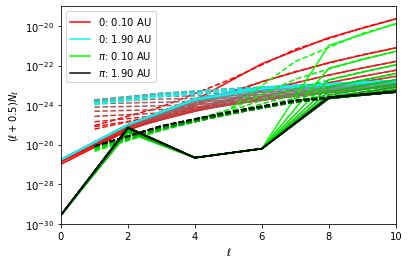

In [21]:
ls = np.arange(len(nl_dist_zero[0]))

for i in range(len(distances)):
    if i==0 or i==len(distances)-1:
        plt.plot(ls[::2], ((ls+.5) * nl_dist_zero[i])[::2], color=choose_color(i, len(distances), stc1, enc1), label = '$0$: {:.2f} AU'.format(distances[i]))
        plt.plot(ls[1::2], ((ls+.5) * nl_dist_zero[i])[1::2], '--', color=choose_color(i, len(distances), stc1, enc1))
    else:
        plt.plot(ls[::2], ((ls+.5) * nl_dist_zero[i])[::2], color=choose_color(i, len(distances), stc1, enc1) )
        plt.plot(ls[1::2], ((ls+.5) * nl_dist_zero[i])[1::2], '--', color=choose_color(i, len(distances), stc1, enc1))


for i in range(len(distances)):
    if i==0 or i==len(distances)-1:
        plt.plot(ls[::2], ((ls+.5) * nl_dist_pi[i])[::2], color=choose_color(i, len(distances), stc2, enc2), label = '$\pi$: {:.2f} AU'.format(distances[i]))
        plt.plot(ls[1::2], ((ls+.5) * nl_dist_pi[i])[1::2], '--', color=choose_color(i, len(distances), stc2, enc2))
    else:
        plt.plot(ls[::2], ((ls+.5) * nl_dist_pi[i])[::2], color=choose_color(i, len(distances), stc2, enc2))
        plt.plot(ls[1::2], ((ls+.5) * nl_dist_pi[i])[1::2], '--', color=choose_color(i, len(distances), stc2, enc2))
plt.xlim(0, 10)
plt.ylim(1e-30, 1e-19)
plt.xlabel('$\ell$')
plt.ylabel('$(\ell+0.5) N_\ell$')
plt.legend()
plt.yscale('log')
plt.savefig('nell_chart_baseline')
plt.show();

## Checking effect of chart angle on TL

In [5]:
angles = np.linspace(0, 1, 5) * np.pi
    tl_angles = [[snl.TwoLISADetector(i) for i in range(6)] for i in range(len(angles))]
for i in range(len(angles)):
    for det in range(3):
        tl_angles[i][det].lam = angles[i]
mc_angles = [snl.MapCalculator(tl_angles[i], f_pivot=f_ref, corr_matrix=rhoTL) for i in range(len(angles))]

In [6]:
nl_angles = []
for i in range(len(angles)):
    nl_angles.append( mc_angles[i].get_N_ell(obs_time, freqs_lr, nside_lr,is_fspacing_log=True) )
    print(f'{angles[i]} done')

0.0 done
0.7853981633974483 done
1.5707963267948966 done
2.356194490192345 done
3.141592653589793 done


In [7]:
np.save('npy_saves/nell_angles', nl_angles)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


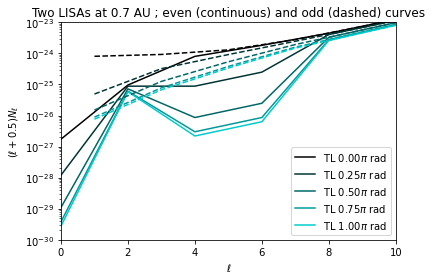

In [8]:
ls = np.arange(len(nl_angles[0]))

for i in range(len(angles)):
    ang = float(angles[i]) / np.pi
    plt.plot(ls[::2], ((ls+.5) * nl_angles[i])[::2], color=choose_color(i, len(angles)), label = 'TL {:.2f}$\pi$ rad'.format(ang))
for i in range(len(angles)):
    ang = float(angles[i]) / np.pi
    plt.plot(ls[1::2], ((ls+.5) * nl_angles[i])[1::2], '--', color=choose_color(i, len(angles)) )#, label = 'TL odd - {:.2f}$\pi$ rad'.format(ang))

plt.title('Two LISAs at 0.7 AU ; even (continuous) and odd (dashed) curves')
plt.xlim(0, 10)
plt.ylim(1e-30, 1e-23)
plt.xlabel('$\ell$')
plt.ylabel('$(\ell+0.5) N_\ell$')
plt.legend()
plt.yscale('log')
plt.show();

## Checking separation of the $N_\ell^{-1}$ sum

In [89]:
parts_L = [pick_nell_sum(mcTL, [indic]) for indic in [(0,0,0,0), (0,0,1,2), (0,1,1,2)]]

6
6
6


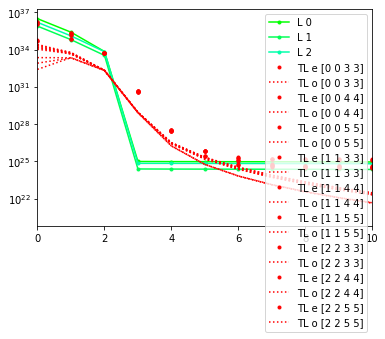

In [111]:
for i in range(3):
    plt.plot(np.abs(parts_L)[i][0][::2], 'b.-', color=choose_color(i, 3), label=f'L {i}')
    #plt.plot(parts_L[i][0][1::2], 'b--', color=choose_color(i, len(id_tl2)), label=f'{i}')
for i,d in enumerate(range(len(id_tl1))):
    plt.plot(parts_1[i][0][::2], 'r.', label=f'TL e {id_tl1[i]}')
    plt.plot(parts_1[i][0][1::2], 'r:', label=f'TL o {id_tl1[i]}')
plt.yscale("log")
plt.xlim(0,10)
#plt.ylim(1e21, 1e25)
plt.legend()
plt.show();

In [5]:
tool1 = np.array([[0,1], [0,2], [1, 0], [1,2], [2,0], [2,1]])
tool2 = tool1 + 3
def pick_nell_sum(mapcalc, indics):
    nellinv = mapcalc.get_N_ell_inv_part(obs_time, freqs_lr, nside_lr, indices=indics,is_fspacing_log=True)
    return nellinv, 1 / nellinv

In [6]:
id_full = np.array(list(it.product(range(6), range(6), range(6), range(6) ) ))
id_lisa = np.array(list(it.product(range(3), range(3), range(3), range(3) ) ))
id_tl1 = np.array([[a, a, c, c] for a in range(3) for c in range(3, 6)])
id_tl2 = np.array([[a, a, c, d] for a in range(3) for c,d in tool2])
id_tl3 = np.array([[a, b, c, d] for a,b in tool1 for c,d in tool2])

In [37]:
parts_1 = [pick_nell_sum(mcTL, [indic]) for indic in id_tl1]

6
6
6
6
6
6
6
6
6


In [38]:
parts_2 = [pick_nell_sum(mcTL, [indic]) for indic in id_tl2]

6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6


In [39]:
parts_3 = [pick_nell_sum(mcTL, [indic]) for indic in id_tl3]

6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6


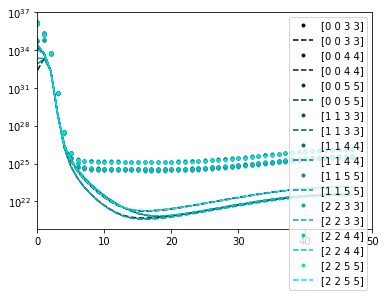

In [139]:
ls = np.arange(3 * nside_lr)

plt.figure()
#"""
for i,d in enumerate(range(len(id_tl1))):
    plt.plot(parts_1[i][0][::2], 'r.', color=choose_color(i, len(id_tl1)), label=f'{id_tl1[i]}')
    plt.plot(parts_1[i][0][1::2], 'r--', color=choose_color(i, len(id_tl1)), label=f'{id_tl1[i]}')
"""
for i,d in enumerate(range(len(id_tl2))):
    plt.plot(np.abs(parts_2)[i][0][::2], 'b.-', color=choose_color(i, len(id_tl2)), label=f'{id_tl2[i]}')
    plt.plot(np.abs(parts_2)[i][0][1::2], 'b--', color=choose_color(i, len(id_tl2)), label=f'{id_tl2[i]}')
"""
"""
for i,d in enumerate(range(len(id_tl3))):
    plt.plot(parts_3[i][0][::2], 'g.', label=f'{id_tl3[i]}')
    plt.plot(parts_3[i][0][1::2], 'g--', label=f'{id_tl3[i]}')
    # plt.plot(ls[::2], ((ls+.5) *nl_dist[d])[::2], '.-', color=choose_color(i, len(id_tl3)), label=f"2LISAs - even - {distances[d]} AU")
"""
plt.yscale("log")
plt.xlim(0,50)
#plt.ylim(1e21, 1e25)
plt.legend()
plt.show();

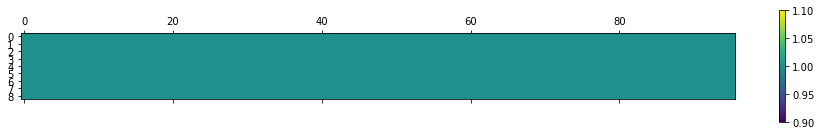

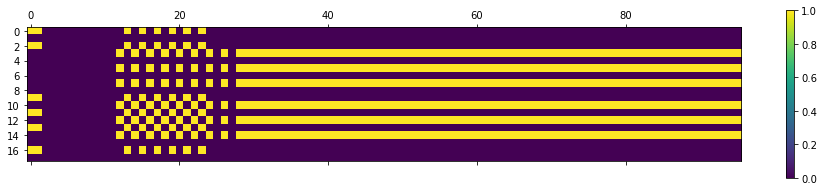

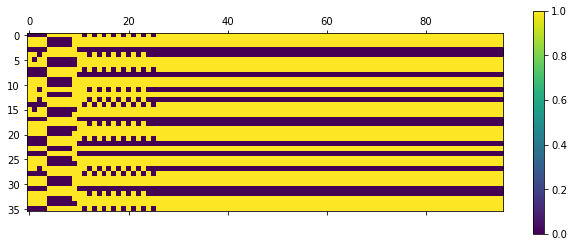

In [78]:
#parts_3[:][0][:5]
plt.matshow(np.array(parts_1)[:,0,:] > 0)
plt.colorbar()
plt.matshow(np.array(parts_2)[:,0,:] > 0)
plt.colorbar()
plt.matshow(np.array(parts_3)[:,0,:] > 0)
plt.colorbar()

In [7]:
"""nell_inv_TL_full = mcTL.get_N_ell_inv_part(obs_time, freqs_lr, nside_lr, indices=id_full,is_fspacing_log=True)
nell_inv_TL_L = nell_inv_TLtest = mcTL.get_N_ell_inv_part(obs_time, freqs_lr, nside_lr, indices=id_lisa,is_fspacing_log=True)
nell_TLtest = 1 / nell_inv_TL_full"""

nell_inv_TL_L, nell_Tl_L = pick_nell_sum(mcTL, id_lisa)
nell_inv_TL_1, nell_Tl_1 = pick_nell_sum(mcTL, id_tl1)
nell_inv_TL_2, nell_Tl_2 = pick_nell_sum(mcTL, id_tl2)
nell_inv_TL_3, nell_Tl_3 = pick_nell_sum(mcTL, id_tl3)

6
6
6
6


In [17]:
nell_inv_TLs = [nell_inv_TL_L, nell_inv_TL_1, nell_inv_TL_2, nell_inv_TL_3]
for i, id in enumerate(['L', '1', '2', '3']):
    with open(f'npy_saves/nell_inv_TL_{id}.npy', 'wb') as file:
        np.save(file, nell_inv_TLs[i])

In [9]:
"""
NA_onelisa = np.array([[(i<3 and j<3) for j in range(6)] for i in range(6)])
projvec_onelisa = np.zeros((6, 6))
projvec_onelisa[3, 3], projvec_onelisa[4, 4], projvec_onelisa[5, 5] = 1, 1, 1
proj_onelisa = {'vectors':projvec_onelisa, 'deproject':True}
nell_TLtest_OL = mcTL.get_N_ell_inv_part(obs_time, freqs_lr, nside_lr, indices=id_full,is_fspacing_log=True, no_autos=NA_onelisa)
nell_TLtest_OL_real = 1 / nell_TLtest_OL
""";
bigtest_inv = 2 * nell_inv_TL_L + 2 * ( nell_inv_TL_1 + 2 * nell_inv_TL_2 + nell_inv_TL_3 )
bigtest = 1 / bigtest_inv

In [10]:
nellL = mcL.get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True)
print('LISA done')
nellTL = mcTL.get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True)
print('Two LISAs done')

LISA done
Two LISAs done


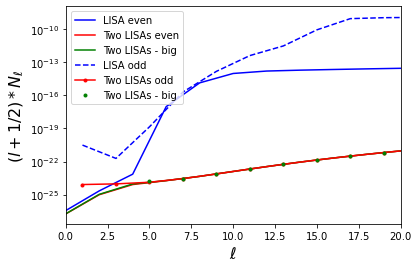

In [17]:
ls = np.arange(3 * nside_lr)

plt.plot(ls[::2], ((ls + .5) * nellL)[::2], 'b', label='LISA even')
plt.plot(ls[::2], ((ls + .5) * nellTL)[::2], 'r', label='Two LISAs even')
plt.plot(ls[::2], ((ls + .5) * bigtest)[::2], 'g', label='Two LISAs - big')
#plt.plot(ls[::2], ((ls + .5) * nell_onelisa)[::2], 'k', label='TL - one LISA')

#plt.plot(ls[::2], ((ls + .5) * nell_TLtest_OL_real)[::2], color='purple', label='Two LISAs OL - test')

plt.plot(ls[1::2], ((ls + .5) * nellL)[1::2], 'b--', label='LISA odd')
plt.plot(ls[1::2], ((ls + .5) * nellTL)[1::2], 'r.-', label='Two LISAs odd')
plt.plot(ls[1::2], ((ls + .5) * bigtest)[1::2], 'g.', label='Two LISAs - big')
#plt.plot(ls[1::2], ((ls + .5) * nell_onelisa)[1::2], 'k--', label='TL - one LISA odd')


plt.yscale("log")
plt.xlabel(r'$\ell$', fontsize=16)
plt.ylabel(r'$(l+1/2) * N_\ell$', fontsize=16)
plt.xlim(0, 20)
#plt.ylim(1e-33, 1e-20)
plt.legend()
plt.show();

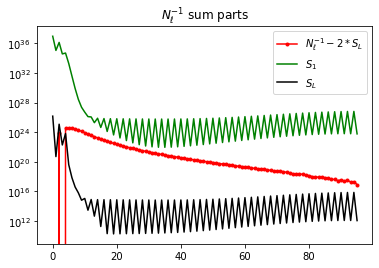

In [31]:
#plt.plot(-(2*nell_inv_TL_1 + 4*nell_inv_TL_2 + 2*nell_inv_TL_3), '.', color='purple', label='$N_\ell^{-1} - 2*S_L$')
plt.plot((2*nell_inv_TL_1 + 4*nell_inv_TL_2 + 2*nell_inv_TL_3), 'r.-', label='$N_\ell^{-1} - 2*S_L$')
#plt.plot(-4*nell_inv_TL_2, 'b', label='TL2')
plt.plot(nell_inv_TL_1, 'g', label='$S_1$')
plt.plot(nell_inv_TL_L, 'k', label='$S_L$')

plt.title('$N_\ell^{-1}$ sum parts')
plt.legend()
plt.yscale('log')

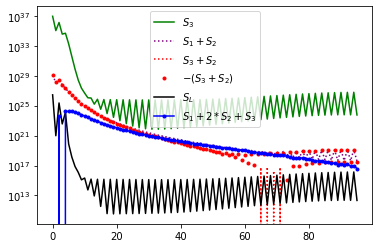

In [27]:
plt.plot(nell_inv_TL_3, 'g', label='$S_3$')
plt.plot((nell_inv_TL_1 + nell_inv_TL_2), ':', color='purple', label='$S_1 + S_2$')
plt.plot((nell_inv_TL_3 + nell_inv_TL_2), ':', color='red', label='$S_3 + S_2$')
plt.plot(-(nell_inv_TL_3 + nell_inv_TL_2), '.', color='red', label='$-(S_3 + S_2)$')
plt.plot(2*nell_inv_TL_L, 'k', label='$S_L$')
plt.plot((nell_inv_TL_1 + 2*nell_inv_TL_2 + nell_inv_TL_3), 'b.-', label='$S_1 + 2*S_2 + S_3$')
plt.yscale('log')
plt.legend()
plt.show()

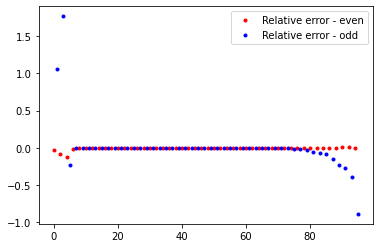

In [12]:
plt.plot(ls[::2], (((ls + .5) * nellTL - (ls + .5) * bigtest) / ((ls + .5) * nellTL))[::2], 'r.', label='Relative error - even')
plt.plot(ls[1::2], (((ls + .5) * nellTL - (ls + .5) * bigtest) / ((ls + .5) * nellTL))[1::2], 'b.', label='Relative error - odd')
plt.legend()
#plt.yscale('log')

In [13]:
temp = 1 / nellTL - 1 /bigtest

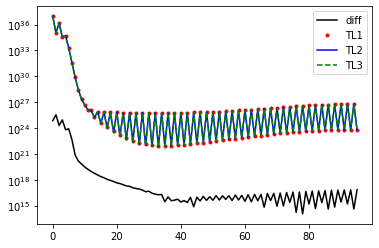

In [14]:
plt.plot(np.abs(temp), 'k', label='diff')
plt.plot(nell_inv_TL_1, 'r.', label='TL1')
plt.plot(np.abs(nell_inv_TL_2), 'b', label='TL2')
plt.plot(nell_inv_TL_3, 'g--', label='TL3')
plt.legend()
plt.yscale('log')

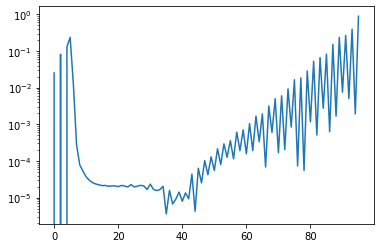

In [16]:
plt.plot(np.abs(temp) *bigtest)
plt.yscale('log')

In [48]:
sumTL = 1 / nellTL
sumL = 1 / nellL
print(((sumTL - 2*sumL)*1e-24)[:10:2])
print((sumTL*1e-24)[:10:2])

[1.7633778  2.7277483  4.32851705 3.56017643 1.90013778]
[287.86023754  26.02196611   5.60002058   3.56017778   1.90013779]


## Parallelizing

In [ ]:
mcL.get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True,
                      proj={'vectors': np.ones(3),
                            'deproject': True})

## Checking antenna parity

In [5]:
def get_opp(theta, phi):
    return ( np.pi - theta, phi + np.pi )
thetaopp, phiopp = get_opp(theta, phi)


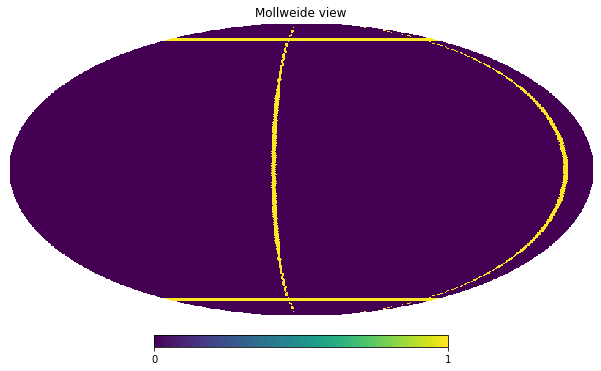

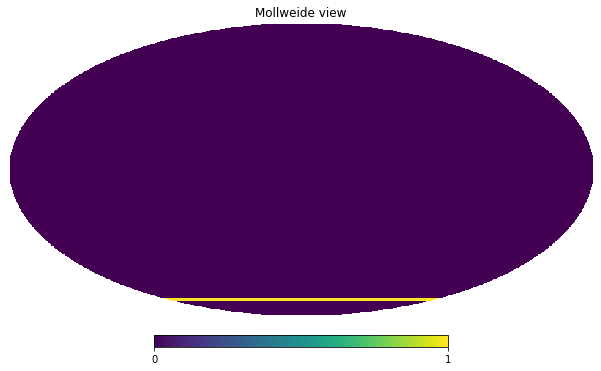

In [71]:
def fixed_phi(theta, phi, val=0):
    return np.array([(p<val+2e-2 and p>val-2e-2) for p in phi%(2*np.pi)])

def fixed_theta(theta, phi, val=0):
    return np.array([(p<val+2e-2 and p>val-2e-2) for p in theta%np.pi])


val = 0.3
hp.mollview(fixed_theta(theta, phi, val) + fixed_phi(theta, phi, 0.3) + fixed_theta(thetaopp, phiopp, val) + fixed_phi(thetaopp, phiopp, 0.3))
hp.mollview(fixed_theta(thetaopp, phi, val))

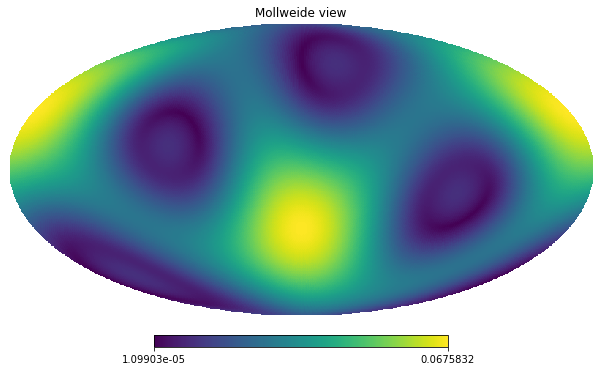

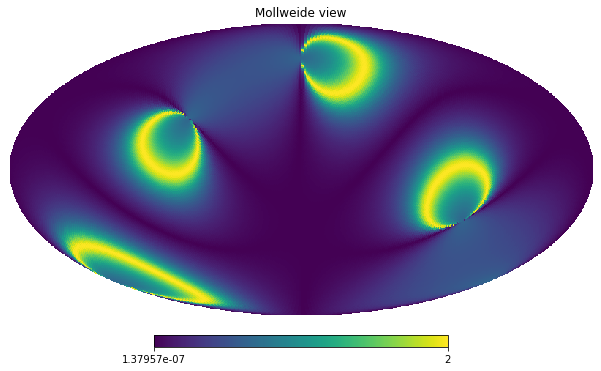

In [9]:
def apc(mapcalc, theta, phi, i=0, j=1, f=1e-2, t=0, inc_baseline=True, relative=False):
    theta2, phi2 = get_opp(theta, phi)
    diff = np.abs(mapcalc.get_antenna(i, j, t, f, theta, phi, inc_baseline=inc_baseline) - mapcalc.get_antenna(i, j, t, f, theta2, phi2, inc_baseline=inc_baseline))
    if relative:
        return diff / np.abs(mapcalc.get_antenna(i, j, t, f, theta, phi, inc_baseline=inc_baseline))
    return diff

mc = mcTL
i = 0
j = 2
relative = True
checkpar = apc(mc, theta, phi, i=i, j=j, relative=relative)
hp.mollview(np.abs(mc.get_antenna(i, j, 0, 1e-2, theta, phi)))
hp.mollview(checkpar)

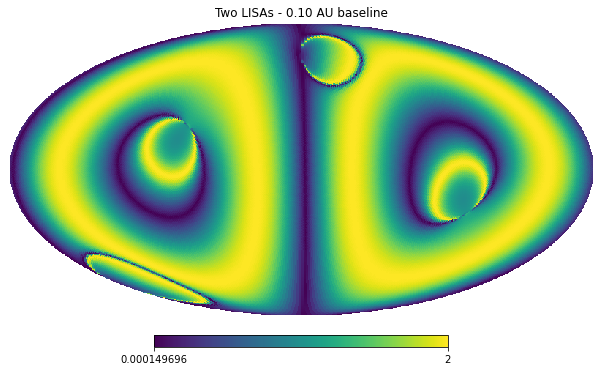

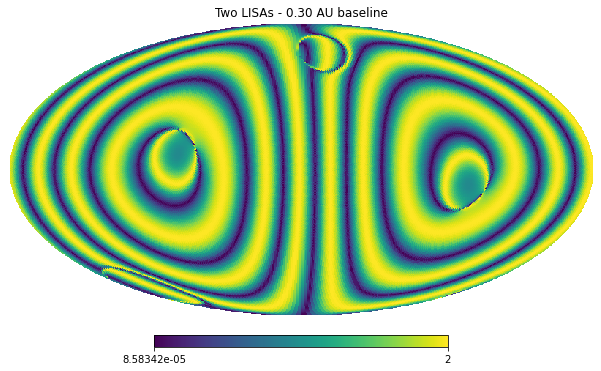

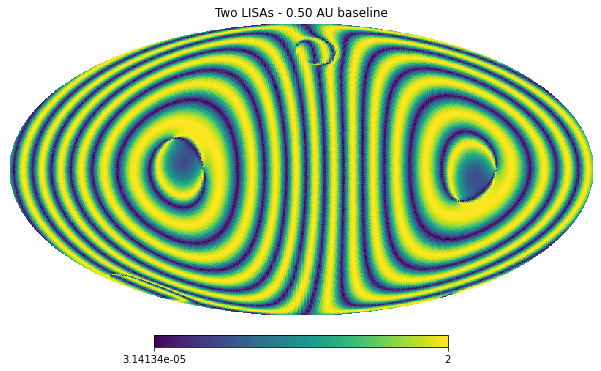

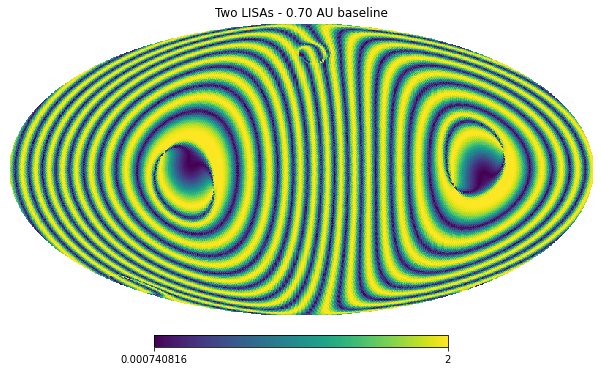

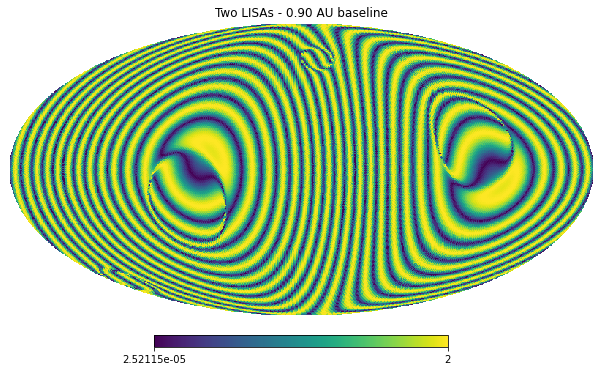

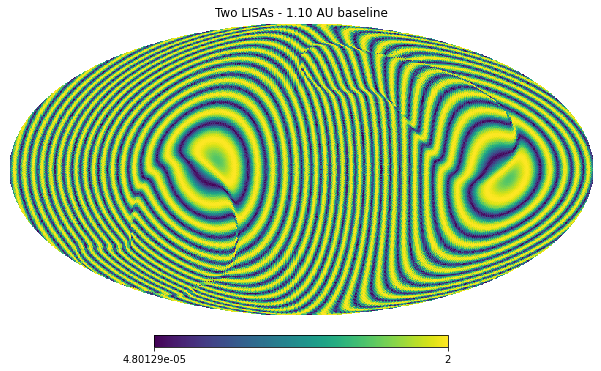

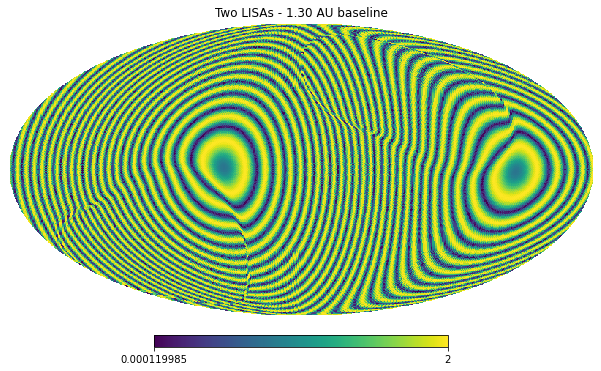

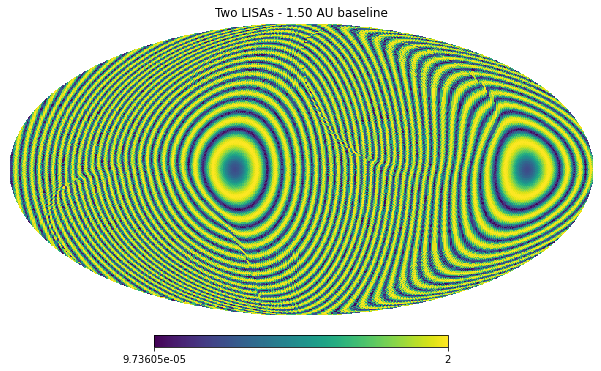

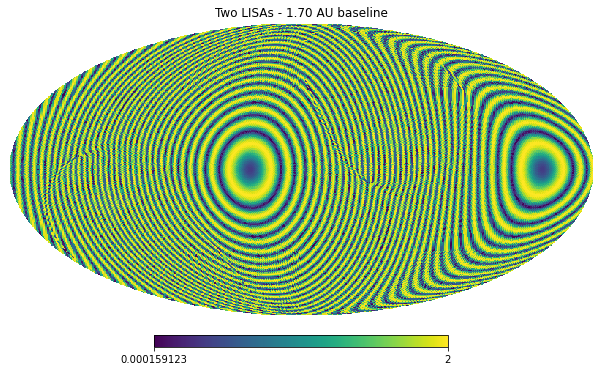

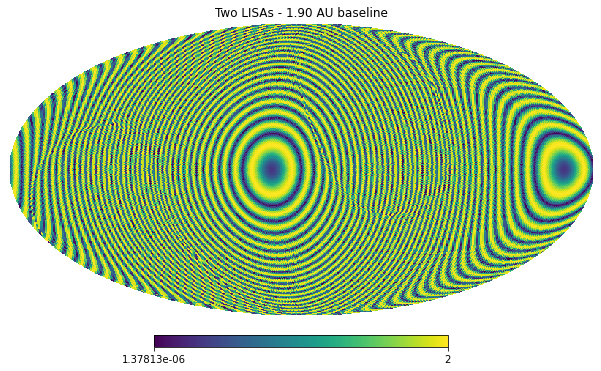

In [23]:
distances = np.arange(0.1, 2.1, 0.2)
twolisa_dist = np.array([[snl.LISAandALIADetector(i, separation=dist) for i in range(6)] for dist in distances])
rhoTL_dist = [snl.NoiseCorrelationTwoLISA(twolisa_dist[d, 0]) for d in range(len(distances))]
mcTL_dist = [snl.MapCalculator(twolisa_dist[d], f_pivot=f_ref, corr_matrix=rhoTL_dist[d]) for d in range(len(distances))]
i = 0
j = 5
relative = True
for k in range(len(distances)):
    mc = mcTL_dist[k]
    dist = distances[k]
    checkpar = apc(mc, theta, phi, i=i, j=j, relative=relative)
    hp.mollview(checkpar, title=f'Two LISAs - {dist:.2f} AU baseline')

## Two LISAs -- baseline

In [18]:
distances = np.arange(0.1, 2, 0.2)
twolisa_dist = np.array([[snl.LISAandALIADetector(i, separation=dist) for i in range(6)] for dist in distances])
rhoTL_dist = [snl.NoiseCorrelationTwoLISA(twolisa_dist[d, 0]) for d in range(len(distances))]
mcTL_dist = [snl.MapCalculator(twolisa_dist[d], f_pivot=f_ref, corr_matrix=rhoTL_dist[d]) for d in range(len(distances))]

In [19]:
nl_dist = []
for d in range(len(distances)):
    nl_dist.append(mcTL_dist[d].get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True,
                        proj={'vectors': np.array([[1,1,1,0,0,0], [0,0,0,1,1,1]]),
                            'deproject': True}))
    print(f"{distances[d]} AU : done")

0.1 AU : done
0.30000000000000004 AU : done
0.5000000000000001 AU : done
0.7000000000000001 AU : done
0.9000000000000001 AU : done
1.1000000000000003 AU : done
1.3000000000000003 AU : done
1.5000000000000004 AU : done
1.7000000000000004 AU : done
1.9000000000000004 AU : done


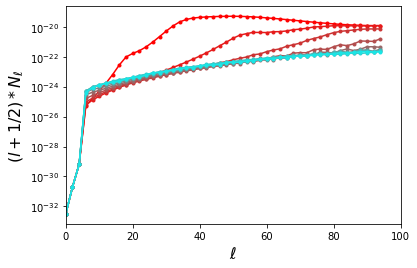

In [27]:
ls = np.arange(3 * nside_lr)
start_color = np.array((1, 0, 0, 1))
end_color = np.array((0, 1, 1, 1))
def choose_color(i, n, st_c=start_color, en_c=end_color):
    return st_c + (en_c-st_c) * i / n


plt.figure()
#"""
for i,d in enumerate(range(len(distances))):
    plt.plot(ls[::2], ((ls+.5) *nl_dist[d])[::2], '.-', color=choose_color(i, len(distances)), label=f"2LISAs - even - {distances[d]} AU")
"""
for d in range(len(distances)):
    plt.plot(ls[1::2], ((ls+.5) *nl_dist[d])[1::2], '--', label=f"2LISAs - odd - {distances[d]} AU")
"""
"""
for d in range(len(distances)):
    plt.plot(ls[1::2], ((ls+.5) *nl_all_dist[d])[1::2], '-.', label=f"2LISAs all - odd - {distances[d]} AU")
"""
plt.yscale("log")
plt.xlabel(r'$\ell$', fontsize=16)
plt.ylabel(r'$(l+1/2) * N_\ell$', fontsize=16)
plt.xlim(0, 100)
#plt.ylim(1e-33, 1e-20)
#plt.legend()
plt.show();

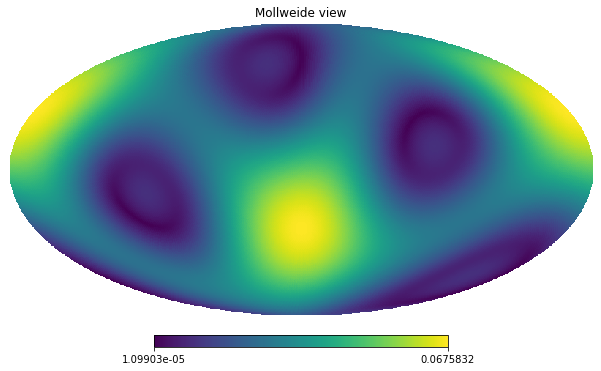

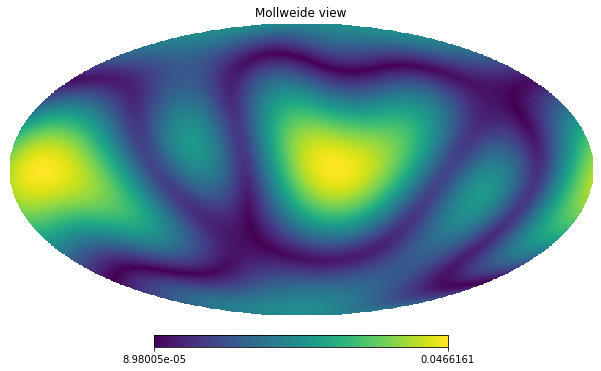

In [88]:
antL = np.abs(mcL.get_antenna(i=0, j=1, t=0., f=1e-2, theta=theta, phi=phi))
antTL = np.abs(mcTL.get_antenna(i=0, j=4, t=0., f=1e-2, theta=theta, phi=phi))
hp.mollview(antL)
hp.mollview(antTL)
plt.show()

In [19]:
test = np.arcsin(np.arange(-len(theta), len(theta), 2) / len(theta)) + np.pi / 2

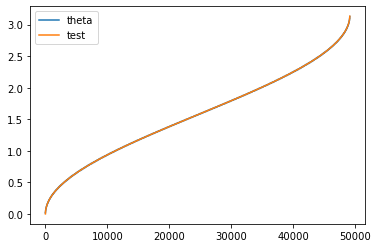

In [20]:
plt.plot(theta, label='theta')
plt.plot(test, label='test')
plt.legend()

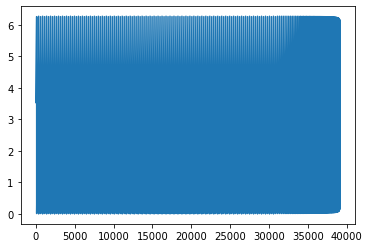

In [21]:
plt.plot(phi[10000:])

## Checking two LISAs

In [113]:
nlTL = mcTL.get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True,
                      proj={'vectors': np.array([[1,1,1,0,0,0], [0,0,0,1,1,1]]),
                            'deproject': True})
print("Two LISAs done")

nlL = mcL.get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True,
                      proj={'vectors': np.ones(3),
                            'deproject': True})
print("LISA done")



Two LISAs done
LISA done


In [6]:
nl_noproj = mcTL.get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True)
print("hello there")

hello there


In [17]:
nl_proj2 = mcTL.get_N_ell(obs_time, freqs_lr, nside_lr, is_fspacing_log=True,
                      proj={'vectors': np.ones(6),
                            'deproject': True})

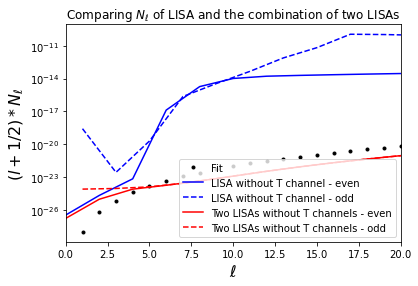

In [135]:
ls = np.arange(3 * nside_lr)
plt.figure()

b = 1e-28
alpha = 6

plt.plot(ls[:], (b* ls**alpha)[:], 'k.', label='Fit')

plt.plot(ls[::2], (ls[::2]+0.5) * nlL[::2], 'b-', label='LISA without T channel - even')
plt.plot(ls[1::2], (ls[:1:2]+0.5) * nlL[1::2], 'b--', label='LISA without T channel - odd')

#plt.plot(ls[::2], (ls[::2]+0.5) * nl_noproj[::2], 'g-', label='TL all data - even')
#plt.plot(ls[1::2], (ls[1::2]+0.5) * nl_noproj[1::2], 'g--', label='all data - odd')
plt.plot(ls[::2], (ls[::2]+0.5) * nlTL[::2], 'r-', label='Two LISAs without T channels - even')
plt.plot(ls[1::2], (ls[1::2]+0.5) * nlTL[1::2], 'r--', label='Two LISAs without T channels - odd')

plt.xlim([0, 20])
#plt.ylim([5E-34, 5E-14])
plt.title('Comparing $N_\ell$ of LISA and the combination of two LISAs')
plt.legend(loc='lower right')
plt.xlabel(r'$\ell$', fontsize=16)
plt.ylabel(r'$(l+1/2) * N_\ell$', fontsize=16)
plt.yscale('log');

## ALIA data check

In [4]:
import json
with open("ALIA.json") as file:
    datafile = json.load(file)
data = np.array(datafile['data'])

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


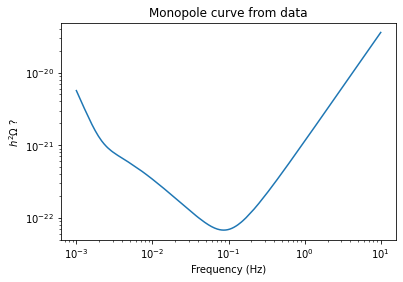

In [5]:
f, om = data[:,0], data[:,1]
plt.plot(f, om)
plt.title('Monopole curve from data')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$h^2 \Omega$ ?')
plt.loglog();